In [1]:
import pandas as pd
import numpy as np
import plotly.express as px


In [2]:
fifa = pd.read_csv('fifa_eda.csv')
fifa.head()

,ID,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Foot,International Reputation,Skill Moves,Position,Joined,Contract Valid Until,Height,Weight,Release Clause
0,158023,L. Messi,31,Argentina,94,94,FC Barcelona,110500.0,565.0,Left,5.0,4.0,RF,2004,2021-01-01,5.583333,159.0,226500.0
1,20801,Cristiano Ronaldo,33,Portugal,94,94,Juventus,77000.0,405.0,Right,5.0,5.0,ST,2018,2022-01-01,6.166667,183.0,127100.0
2,190871,Neymar Jr,26,Brazil,92,93,Paris Saint-Germain,118500.0,290.0,Right,5.0,5.0,LW,2017,2022-01-01,5.750000,150.0,228100.0
3,193080,De Gea,27,Spain,91,93,Manchester United,72000.0,260.0,Right,4.0,1.0,GK,2011,2020-01-01,6.333333,168.0,138600.0
4,192985,K. De Bruyne,27,Belgium,91,92,Manchester City,102000.0,355.0,Right,4.0,4.0,RCM,2015,2023-01-01,5.916667,154.0,196400.0


In [3]:
df = fifa.drop(['ID', 'Contract Valid Until', 'Release Clause'], axis=1)
df.head()

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Foot,International Reputation,Skill Moves,Position,Joined,Height,Weight
0,L. Messi,31,Argentina,94,94,FC Barcelona,110500.0,565.0,Left,5.0,4.0,RF,2004,5.583333,159.0
1,Cristiano Ronaldo,33,Portugal,94,94,Juventus,77000.0,405.0,Right,5.0,5.0,ST,2018,6.166667,183.0
2,Neymar Jr,26,Brazil,92,93,Paris Saint-Germain,118500.0,290.0,Right,5.0,5.0,LW,2017,5.750000,150.0
3,De Gea,27,Spain,91,93,Manchester United,72000.0,260.0,Right,4.0,1.0,GK,2011,6.333333,168.0
4,K. De Bruyne,27,Belgium,91,92,Manchester City,102000.0,355.0,Right,4.0,4.0,RCM,2015,5.916667,154.0


In [4]:
df.loc[4]

Name                           K. De Bruyne
Age                                      27
Nationality                         Belgium
Overall                                  91
Potential                                92
Club                        Manchester City
Value                              102000.0
Wage                                  355.0
Preferred Foot                        Right
International Reputation                4.0
Skill Moves                             4.0
Position                                RCM
Joined                                 2015
Height                             5.916667
Weight                                154.0
Name: 4, dtype: object

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18207 entries, 0 to 18206
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Name                      18207 non-null  object 
 1   Age                       18207 non-null  int64  
 2   Nationality               18207 non-null  object 
 3   Overall                   18207 non-null  int64  
 4   Potential                 18207 non-null  int64  
 5   Club                      17966 non-null  object 
 6   Value                     17955 non-null  float64
 7   Wage                      18207 non-null  float64
 8   Preferred Foot            18207 non-null  object 
 9   International Reputation  18159 non-null  float64
 10  Skill Moves               18159 non-null  float64
 11  Position                  18207 non-null  object 
 12  Joined                    18207 non-null  int64  
 13  Height                    18207 non-null  float64
 14  Weight

In [6]:
df['International Reputation'].value_counts()

1.0    16532
2.0     1261
3.0      309
4.0       51
5.0        6
Name: International Reputation, dtype: int64

In [7]:
df.isnull().sum()

Name                          0
Age                           0
Nationality                   0
Overall                       0
Potential                     0
Club                        241
Value                       252
Wage                          0
Preferred Foot                0
International Reputation     48
Skill Moves                  48
Position                      0
Joined                        0
Height                        0
Weight                        0
dtype: int64

In [8]:
df.Club.describe()

count            17966
unique             651
top       FC Barcelona
freq                33
Name: Club, dtype: object

In [9]:
df.Club.value_counts().nlargest(20)

FC Barcelona               33
Valencia CF                33
Fortuna Düsseldorf         33
Cardiff City               33
Rayo Vallecano             33
CD Leganés                 33
Frosinone                  33
Newcastle United           33
Southampton                33
Burnley                    33
Eintracht Frankfurt        33
Wolverhampton Wanderers    33
TSG 1899 Hoffenheim        33
Everton                    33
AS Monaco                  33
RC Celta                   33
Empoli                     33
Manchester City            33
Manchester United          33
Borussia Dortmund          33
Name: Club, dtype: int64

In [10]:
df.duplicated().sum()

0

In [11]:
df.dtypes

Name                         object
Age                           int64
Nationality                  object
Overall                       int64
Potential                     int64
Club                         object
Value                       float64
Wage                        float64
Preferred Foot               object
International Reputation    float64
Skill Moves                 float64
Position                     object
Joined                        int64
Height                      float64
Weight                      float64
dtype: object

In [12]:
df.select_dtypes(include=['object'])

,Name,Nationality,Club,Preferred Foot,Position
0,L. Messi,Argentina,FC Barcelona,Left,RF
1,Cristiano Ronaldo,Portugal,Juventus,Right,ST
2,Neymar Jr,Brazil,Paris Saint-Germain,Right,LW
3,De Gea,Spain,Manchester United,Right,GK
4,K. De Bruyne,Belgium,Manchester City,Right,RCM
...,...,...,...,...,...
18202,J. Lundstram,England,Crewe Alexandra,Right,CM
18203,N. Christoffersson,Sweden,Trelleborgs FF,Right,ST
18204,B. Worman,England,Cambridge United,Right,ST
18205,D. Walker-Rice,England,Tranmere Rovers,Right,RW


In [13]:
df.select_dtypes(include=['object']).columns

Index(['Name', 'Nationality', 'Club', 'Preferred Foot', 'Position'], dtype='object')

In [14]:
df.select_dtypes(include=['int64', 'float64']).columns

Index(['Age', 'Overall', 'Potential', 'Value', 'Wage',
       'International Reputation', 'Skill Moves', 'Joined', 'Height',
       'Weight'],
      dtype='object')

In [15]:
df.select_dtypes(include=[np.number]).columns

Index(['Age', 'Overall', 'Potential', 'Value', 'Wage',
       'International Reputation', 'Skill Moves', 'Joined', 'Height',
       'Weight'],
      dtype='object')

In [16]:
df['International Reputation'] = df['International Reputation'].astype('object')

In [17]:
df['International Reputation'].dtype

dtype('O')

In [18]:
df['Skill Moves'].value_counts()

2.0    8565
3.0    6600
1.0    2026
4.0     917
5.0      51
Name: Skill Moves, dtype: int64

In [19]:
df['Skill Moves'] = df['Skill Moves'].astype('object')

In [20]:
quant_cols = [col for col in df.columns if df[col].dtypes != 'O']
quant_cols

['Age', 'Overall', 'Potential', 'Value', 'Wage', 'Joined', 'Height', 'Weight']

In [21]:
df[quant_cols]

,Age,Overall,Potential,Value,Wage,Joined,Height,Weight
0,31,94,94,110500.0,565.0,2004,5.583333,159.0
1,33,94,94,77000.0,405.0,2018,6.166667,183.0
2,26,92,93,118500.0,290.0,2017,5.750000,150.0
3,27,91,93,72000.0,260.0,2011,6.333333,168.0
4,27,91,92,102000.0,355.0,2015,5.916667,154.0
...,...,...,...,...,...,...,...,...
18202,19,47,65,60.0,1.0,2017,5.750000,134.0
18203,19,47,63,60.0,1.0,2018,6.250000,170.0
18204,16,47,67,60.0,1.0,2017,5.666667,148.0
18205,17,47,66,60.0,1.0,2018,5.833333,154.0


In [22]:
df['Value'].describe()

count     17955.000000
mean       2444.530214
std        5626.715434
min          10.000000
25%         325.000000
50%         700.000000
75%        2100.000000
max      118500.000000
Name: Value, dtype: float64

In [23]:
qual_cols = [col for col in df.columns if df[col].dtypes == 'O']
qual_cols

['Name',
 'Nationality',
 'Club',
 'Preferred Foot',
 'International Reputation',
 'Skill Moves',
 'Position']

In [24]:
fill_mean = lambda col : col.fillna(col.median())

df[quant_cols] = df[quant_cols].apply(fill_mean)

In [25]:
df.isnull().sum()

Name                          0
Age                           0
Nationality                   0
Overall                       0
Potential                     0
Club                        241
Value                         0
Wage                          0
Preferred Foot                0
International Reputation     48
Skill Moves                  48
Position                      0
Joined                        0
Height                        0
Weight                        0
dtype: int64

In [26]:
def fill_missing(df):
    quant_cols= [col for col in df.columns if df[col].dtypes != 'O']
    qual_cols = [col for col in df.columns if df[col].dtypes == 'O']
    fill_median = lambda col : col.fillna(col.median())
    fil_mode = lambda col : col.fillna(col.mode()[0])
    df[quant_cols] = df[quant_cols].apply(fill_median)
    df[qual_cols] = df[qual_cols].fillna(fil_mode)
    return df

In [27]:
df2 = fill_missing(df)
df2.isnull().sum()

Name                        0
Age                         0
Nationality                 0
Overall                     0
Potential                   0
Club                        0
Value                       0
Wage                        0
Preferred Foot              0
International Reputation    0
Skill Moves                 0
Position                    0
Joined                      0
Height                      0
Weight                      0
dtype: int64

In [28]:
df.isnull().sum()

Name                        0
Age                         0
Nationality                 0
Overall                     0
Potential                   0
Club                        0
Value                       0
Wage                        0
Preferred Foot              0
International Reputation    0
Skill Moves                 0
Position                    0
Joined                      0
Height                      0
Weight                      0
dtype: int64

In [29]:
df.dropna(inplace=True)
df.isnull().sum()

Name                        0
Age                         0
Nationality                 0
Overall                     0
Potential                   0
Club                        0
Value                       0
Wage                        0
Preferred Foot              0
International Reputation    0
Skill Moves                 0
Position                    0
Joined                      0
Height                      0
Weight                      0
dtype: int64

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18207 entries, 0 to 18206
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Name                      18207 non-null  object 
 1   Age                       18207 non-null  int64  
 2   Nationality               18207 non-null  object 
 3   Overall                   18207 non-null  int64  
 4   Potential                 18207 non-null  int64  
 5   Club                      18207 non-null  object 
 6   Value                     18207 non-null  float64
 7   Wage                      18207 non-null  float64
 8   Preferred Foot            18207 non-null  object 
 9   International Reputation  18207 non-null  object 
 10  Skill Moves               18207 non-null  object 
 11  Position                  18207 non-null  object 
 12  Joined                    18207 non-null  int64  
 13  Height                    18207 non-null  float64
 14  Weight

In [31]:
df.head()

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Foot,International Reputation,Skill Moves,Position,Joined,Height,Weight
0,L. Messi,31,Argentina,94,94,FC Barcelona,110500.0,565.0,Left,5.0,4.0,RF,2004,5.583333,159.0
1,Cristiano Ronaldo,33,Portugal,94,94,Juventus,77000.0,405.0,Right,5.0,5.0,ST,2018,6.166667,183.0
2,Neymar Jr,26,Brazil,92,93,Paris Saint-Germain,118500.0,290.0,Right,5.0,5.0,LW,2017,5.750000,150.0
3,De Gea,27,Spain,91,93,Manchester United,72000.0,260.0,Right,4.0,1.0,GK,2011,6.333333,168.0
4,K. De Bruyne,27,Belgium,91,92,Manchester City,102000.0,355.0,Right,4.0,4.0,RCM,2015,5.916667,154.0


In [32]:
df['Height'] = df['Height'].apply(lambda x : x * 30.48)

In [33]:
df['Weight'] = df['Weight'].apply(lambda x : x * 0.453592)

In [34]:
qualt_cols = [col for col in df.columns if df[col].dtypes == 'O']
df[qualt_cols].head()

,Name,Nationality,Club,Preferred Foot,International Reputation,Skill Moves,Position
0,L. Messi,Argentina,FC Barcelona,Left,5.0,4.0,RF
1,Cristiano Ronaldo,Portugal,Juventus,Right,5.0,5.0,ST
2,Neymar Jr,Brazil,Paris Saint-Germain,Right,5.0,5.0,LW
3,De Gea,Spain,Manchester United,Right,4.0,1.0,GK
4,K. De Bruyne,Belgium,Manchester City,Right,4.0,4.0,RCM


In [35]:
def uni_analysis(col):
    print(df[col].describe()[['min', 'max', 'mean', '50%']])

In [36]:
print('Min Age : ', df['Age'].min())
print('Max Age : ', df['Age'].max())
print('Mean Age : ', df['Age'].median())

Min Age :  16
Max Age :  45
Mean Age :  25.0


In [37]:
df[df['Age'] == df['Age'].min()]

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Foot,International Reputation,Skill Moves,Position,Joined,Height,Weight
11457,W. Geubbels,16,France,64,86,AS Monaco,1000.0,5.0,Right,1.0,3.0,ST,2018,185.42,72.121128
11732,A. Taoui,16,France,64,75,Toulouse Football Club,700.0,3.0,Left,1.0,3.0,ST,2018,177.80,68.945984
12496,Pelayo Morilla,16,Spain,63,81,Real Sporting de Gijón,725.0,1.0,Left,1.0,3.0,RM,2018,182.88,69.853168
12828,Guerrero,16,Spain,63,76,CF Rayo Majadahonda,625.0,1.0,Left,1.0,3.0,CM,2018,180.34,74.842680
13293,H. Massengo,16,France,62,75,AS Monaco,450.0,2.0,Right,1.0,2.0,CDM,2018,177.80,66.224432
13567,Y. Verschaeren,16,Belgium,62,83,RSC Anderlecht,650.0,1.0,Right,1.0,3.0,CAM,2017,172.72,63.049288
15363,Y. Roemer,16,Netherlands,59,75,VVV-Venlo,300.0,1.0,Right,1.0,3.0,ST,2018,180.34,69.853168
15746,Y. Begraoui,16,France,59,81,AJ Auxerre,350.0,1.0,Right,1.0,2.0,ST,2018,175.26,62.142104
15793,J. Lahne,16,Sweden,59,77,IF Brommapojkarna,300.0,1.0,Right,1.0,2.0,ST,2017,170.18,68.038800
16081,J. Italiano,16,Australia,58,79,Perth Glory,280.0,1.0,Right,1.0,3.0,LM,2017,170.18,64.863656


In [38]:
df[df['Age'] == df['Age'].max()].Name.values[0]

'O. Pérez'

In [39]:
df.groupby('Age').mean()

/tmp/ipykernel_11814/4165234777.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.groupby('Age').mean()


,Overall,Potential,Value,Wage,Joined,Height,Weight
Age,,,,,,,
16,54.452381,73.190476,216.428571,1.166667,2017.595238,177.195238,68.557191
17,56.404844,74.339100,404.705882,2.141869,2017.588235,179.748703,71.417916
18,57.741803,73.530055,534.836066,2.229508,2017.357923,180.135273,72.398117
19,59.583008,73.146484,912.553711,2.756836,2017.003906,179.958216,72.338151
20,61.858871,73.213710,1237.677419,4.755645,2016.721774,180.731414,73.469444
21,63.480675,72.957836,1769.645116,6.171469,2016.557976,181.008865,73.785029
22,64.994030,72.819403,2237.380597,7.893284,2016.457463,181.003066,74.290887
23,66.244745,72.555556,2656.403904,8.636637,2016.502252,181.160130,74.790557
24,67.306333,72.079529,3018.206922,9.897644,2016.457290,181.295930,75.433197


In [40]:
df.groupby('Age').mean()['Value']

/tmp/ipykernel_11814/2369493469.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.groupby('Age').mean()['Value']


Age
16     216.428571
17     404.705882
18     534.836066
19     912.553711
20    1237.677419
21    1769.645116
22    2237.380597
23    2656.403904
24    3018.206922
25    3267.100076
26    3381.953857
27    3537.831325
28    3178.147139
29    3154.322211
30    3061.608506
31    3336.379066
32    2587.012195
33    1966.078431
34    1288.861386
35     829.209184
36     595.944882
37     633.841463
38     229.864865
39     276.000000
40     708.846154
41     434.000000
42      40.000000
44     700.000000
45     160.000000
Name: Value, dtype: float64

/tmp/ipykernel_11814/2938446602.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.groupby('Age').mean()['Value'].sort_values().plot(kind= 'bar')


<AxesSubplot: xlabel='Age'>

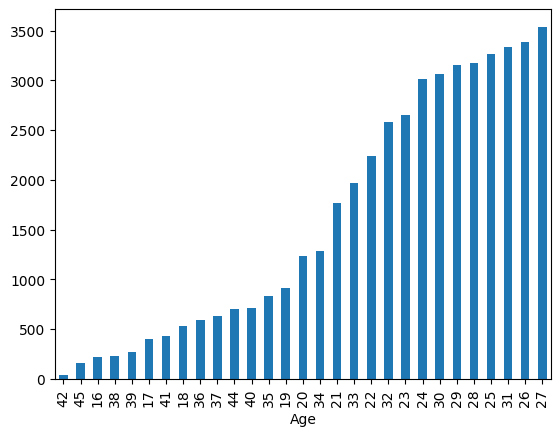

In [41]:
df.groupby('Age').mean()['Value'].sort_values().plot(kind= 'bar')

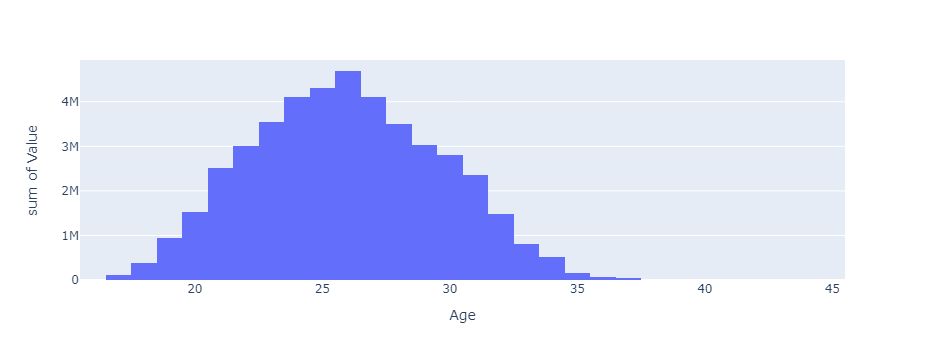

In [42]:
px.histogram(df, x='Age', y='Value')

In [43]:
def group_it(num):
    if 16 <= num <= 20:
        #num > 16 and num < 20
        return 'Junior'
    elif 20 < num <= 30:
        return 'Mid'
    elif num > 30:
        return 'Senior'          


In [44]:
group_it(18)

'Junior'

In [45]:
df['Age_Group'] = df['Age'].apply(group_it)

In [46]:
df.groupby('Age_Group').mean()

/tmp/ipykernel_11814/2603886887.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,Age,Overall,Potential,Value,Wage,Joined,Height,Weight
Age_Group,,,,,,,,
Junior,18.941088,59.685302,73.360084,897.723174,3.312293,2017.034866,180.232270,72.645320
Mid,25.138315,67.359977,71.164498,2894.455603,10.893153,2016.418930,181.386040,75.538163
Senior,33.010070,69.342370,69.342370,2124.399690,12.468629,2015.637103,181.966905,77.493241


In [47]:
df.groupby('Age_Group').mean()['Value']

/tmp/ipykernel_11814/420322577.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



Age_Group
Junior     897.723174
Mid       2894.455603
Senior    2124.399690
Name: Value, dtype: float64

/tmp/ipykernel_11814/2591583108.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



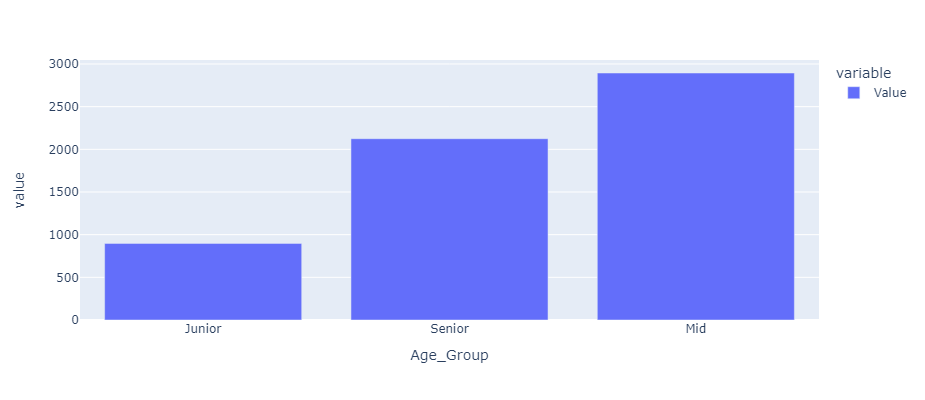

In [48]:
px.bar(df.groupby('Age_Group').mean()['Value'].sort_values(), width= 500, height=400)

# Age

In [49]:
print('Average Age of Players (Mean , Median): ', round(df['Age'].mean(), 0),',', round(df['Age'].median(),0))
print('Maximum Age of Players: ', df['Age'].max(),'----> Player : ', df[df['Age'] == df['Age'].max()]['Name'].values[0])
print('Minimum Age of Players: ', df['Age'].min(),'----> Player : ', df[df['Age'] == df['Age'].min()]['Name'].values[0])

Average Age of Players (Mean , Median):  25.0 , 25.0
Maximum Age of Players:  45 ----> Player :  O. Pérez
Minimum Age of Players:  16 ----> Player :  W. Geubbels


In [50]:
# Average age for every Nationality
age_nationality = df.groupby(['Nationality'])['Age'].median()
age_nationality

Nationality
Afghanistan    22.0
Albania        24.0
Algeria        27.0
Andorra        28.0
Angola         25.0
               ... 
Uzbekistan     29.5
Venezuela      24.0
Wales          24.0
Zambia         21.0
Zimbabwe       26.0
Name: Age, Length: 164, dtype: float64

In [51]:
max_age_nationality = age_nationality.nlargest(5)
max_age_nationality

Nationality
Oman           36.0
Puerto Rico    34.0
Ethiopia       32.0
Kuwait         31.0
Palestine      31.0
Name: Age, dtype: float64

In [52]:
min_age_nationality = age_nationality.nsmallest(5)
min_age_nationality

Nationality
Indonesia      17.0
Botswana       20.0
Rwanda         21.0
Zambia         21.0
Afghanistan    22.0
Name: Age, dtype: float64

In [53]:
# Average age for every Club
age_club = df.groupby(['Club'])['Age'].median()
age_club

Club
<function fill_missing.<locals>.<lambda> at 0x7f0106623e20>    26.0
 SSV Jahn Regensburg                                           25.0
1. FC Heidenheim 1846                                          23.5
1. FC Kaiserslautern                                           23.0
1. FC Köln                                                     24.0
                                                               ... 
Zagłębie Sosnowiec                                             26.0
Çaykur Rizespor                                                25.0
Örebro SK                                                      23.0
Östersunds FK                                                  24.0
Śląsk Wrocław                                                  26.0
Name: Age, Length: 652, dtype: float64

In [54]:
max_age_club = age_club.nlargest(5)
max_age_club

Club
Paraná                       34.0
Botafogo                     32.0
Akhisar Belediyespor         30.0
América FC (Minas Gerais)    30.0
Atlético Mineiro             30.0
Name: Age, dtype: float64

In [55]:
min_age_club = age_club.nsmallest(5)
min_age_club

Club
FC Nordsjælland    19.0
Bohemian FC        20.0
FC Groningen       20.0
Ajax               20.5
Derry City         20.5
Name: Age, dtype: float64

In [56]:
def quant_analysis(df, col, group=None, n=5):
    print(f'Average {col} of Players (Mean , Median): ', round(df[col].mean(), 1),',', round(df[col].median(),1))
    print(f'Maximum {col} of Players: ', df[col].max(),'----> Player : ', df[df[col] == df[col].max()]['Name'].values[0])
    print(f'Minimum {col} of Players: ', df[col].min(),'----> Player : ', df[df[col] == df[col].min()]['Name'].values[0])    
    print('-'*50)
    if group :
        print(f'Largest Average {col} per {group} : ', df.groupby([group])[col].median().nlargest(n))
        print('-'*50)
        print(f'Smallest Average {col} per {group} : ', df.groupby([group])[col].median().nsmallest(n))
 

In [57]:
quant_analysis(df,'Height', group= 'Nationality', n=10)

Average Height of Players (Mean , Median):  181.3 , 180.3
Maximum Height of Players:  205.74 ----> Player :  T. Holý
Minimum Height of Players:  154.94 ----> Player :  N. Barrios
--------------------------------------------------
Largest Average Height per Nationality :  Nationality
South Sudan             200.66
Kuwait                  195.58
Oman                    193.04
Latvia                  190.50
Central African Rep.    187.96
Guatemala               187.96
Lebanon                 187.96
Lithuania               187.96
Philippines             186.69
Belarus                 185.42
Name: Height, dtype: float64
--------------------------------------------------
Smallest Average Height per Nationality :  Nationality
Indonesia               165.10
Malta                   167.64
Fiji                    170.18
Bermuda                 172.72
Comoros                 172.72
Thailand                172.72
United Arab Emirates    172.72
Afghanistan             173.99
Hong Kong              

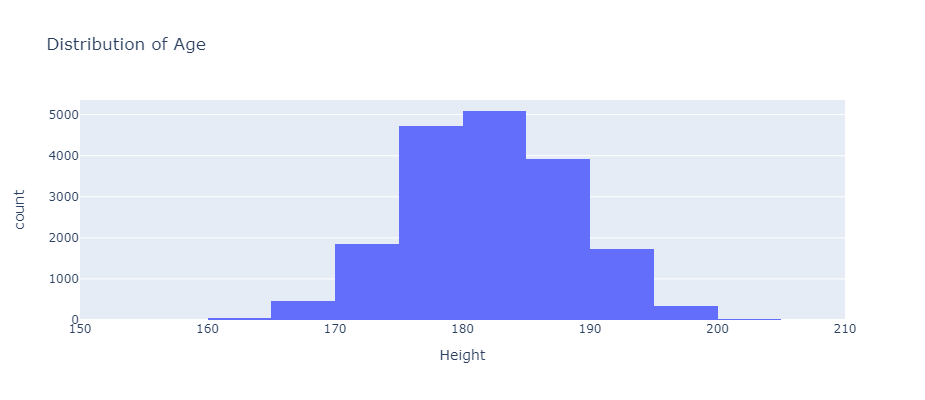

In [58]:
px.histogram(df, x='Height', nbins=20, title='Distribution of Age', width=500, height=400)

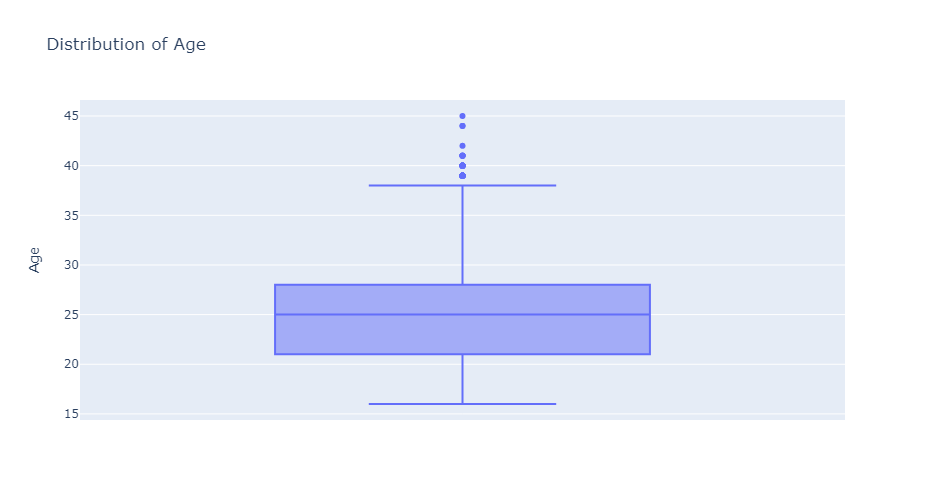

In [59]:
px.box(df, y='Age', title='Distribution of Age', width=500, height=500)

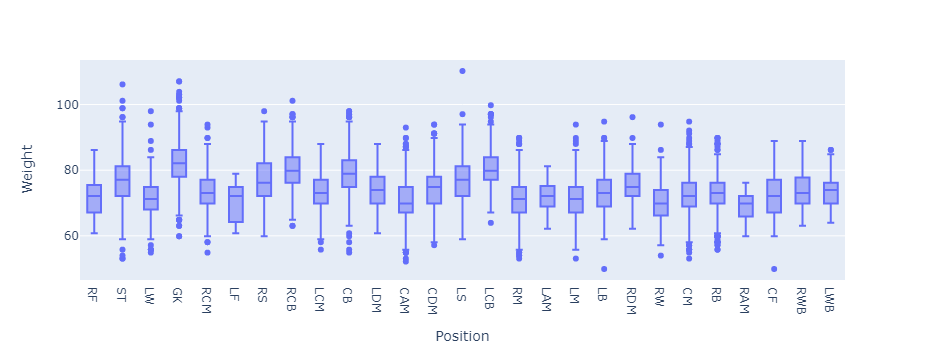

In [60]:
px.box(df, x= 'Position', y='Weight')

In [61]:
#px.box(df[df['Position'] == 'GK' | df['Position'] =='RF'] ,y='Age', title='Distribution of Age', width=500, height=500)

In [62]:
def quant_viz(df, x, y= None, group=None, query=None):
    if y:
        fig = px.scatter(df, x=x, y=y, title=f'Scatter Plot of {x} vs {y}', width=500, height=500)
        fig.show()
    else:   
        fig = px.histogram(df, x=x, nbins=20, title=f'Histogram of {x}', width=500, height=400)
        fig.show()
        fig = px.box(df, y=x, title=f'Box Plot of {x}', width=500, height=500)
        fig.show()
    if group:
        fig = px.box(df[df[group] == query] ,y=y, title=f'Box Plot of {x} for {group} : {query}', width=1000, height=500)
        fig.show()

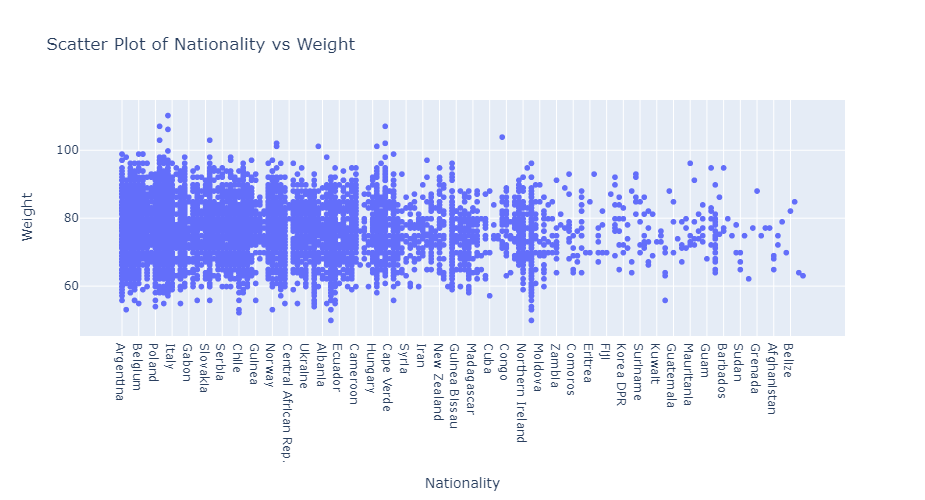

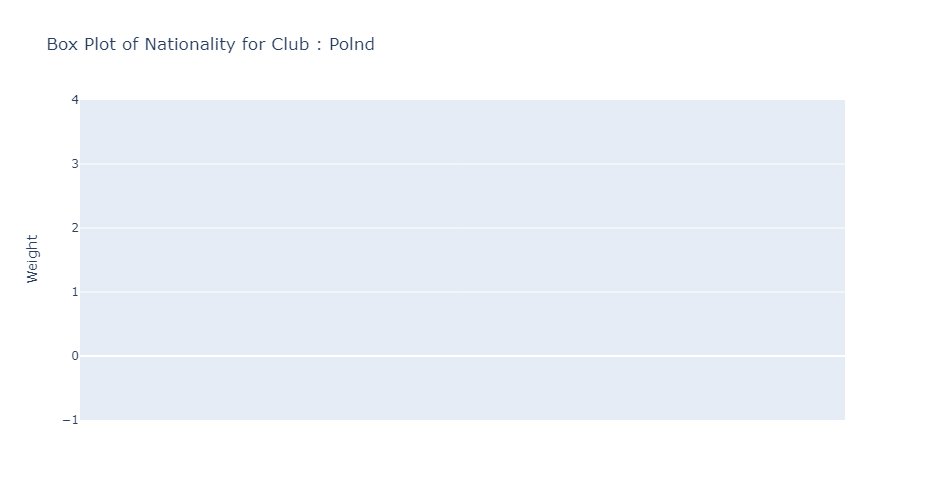

In [63]:
quant_viz(df, 'Nationality', 'Weight', 'Club','Polnd')

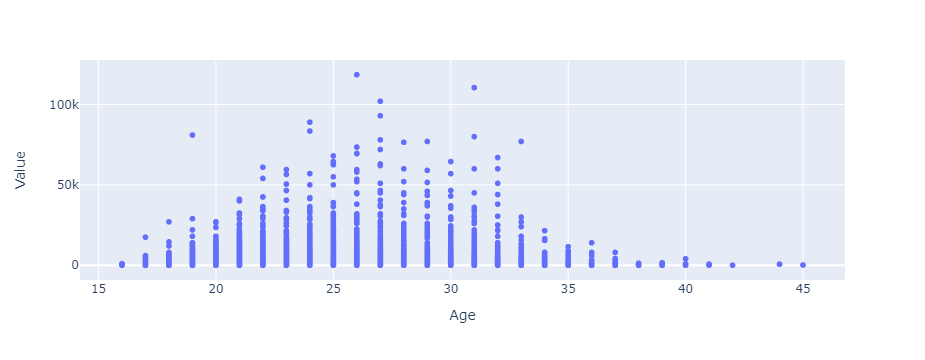

In [64]:
px.scatter(df, 'Age', 'Value', hover_data=['Name', 'Wage'])

In [65]:
df[quant_cols].head()

,Age,Overall,Potential,Value,Wage,Joined,Height,Weight
0,31,94,94,110500.0,565.0,2004,170.18,72.121128
1,33,94,94,77000.0,405.0,2018,187.96,83.007336
2,26,92,93,118500.0,290.0,2017,175.26,68.038800
3,27,91,93,72000.0,260.0,2011,193.04,76.203456
4,27,91,92,102000.0,355.0,2015,180.34,69.853168


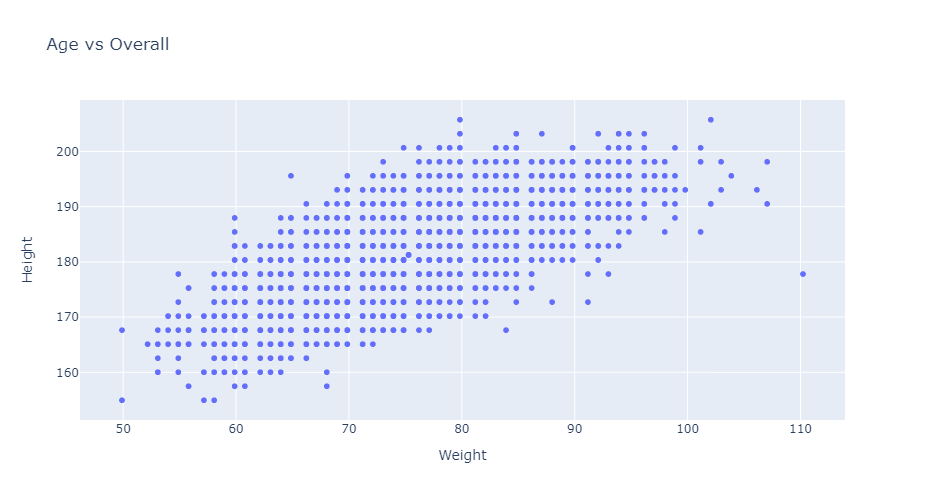

In [66]:
px.scatter(df, y='Height', x='Weight', title='Age vs Overall', width=600, height=500)

In [67]:
#quant_viz(df,  'Wage', 'International Reputation')

In [68]:
df[qualt_cols]

,Name,Nationality,Club,Preferred Foot,International Reputation,Skill Moves,Position
0,L. Messi,Argentina,FC Barcelona,Left,5.0,4.0,RF
1,Cristiano Ronaldo,Portugal,Juventus,Right,5.0,5.0,ST
2,Neymar Jr,Brazil,Paris Saint-Germain,Right,5.0,5.0,LW
3,De Gea,Spain,Manchester United,Right,4.0,1.0,GK
4,K. De Bruyne,Belgium,Manchester City,Right,4.0,4.0,RCM
...,...,...,...,...,...,...,...
18202,J. Lundstram,England,Crewe Alexandra,Right,1.0,2.0,CM
18203,N. Christoffersson,Sweden,Trelleborgs FF,Right,1.0,2.0,ST
18204,B. Worman,England,Cambridge United,Right,1.0,2.0,ST
18205,D. Walker-Rice,England,Tranmere Rovers,Right,1.0,2.0,RW


In [69]:
df.groupby(['Nationality'])['Name'].count().nlargest(10)

Nationality
England        1662
Germany        1198
Spain          1072
Argentina       937
France          914
Brazil          827
Italy           702
Colombia        618
Japan           478
Netherlands     453
Name: Name, dtype: int64

In [70]:
df.groupby(['Nationality'])['Name'].count().nsmallest(10)

Nationality
Andorra      1
Belize       1
Botswana     1
Ethiopia     1
Fiji         1
Grenada      1
Guam         1
Indonesia    1
Jordan       1
Kuwait       1
Name: Name, dtype: int64

In [71]:
df[df['Nationality'] == 'Fiji']

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Foot,International Reputation,Skill Moves,Position,Joined,Height,Weight,Age_Group
4083,R. Krishna,30,Fiji,71,71,Wellington Phoenix,2300.0,4.0,Right,1.0,3.0,RS,2014,170.18,69.853168,Mid


In [72]:
df.groupby(['Club'])['Name'].count().nlargest(30)

Club
<function fill_missing.<locals>.<lambda> at 0x7f0106623e20>    241
AS Monaco                                                       33
Arsenal                                                         33
Atlético Madrid                                                 33
Borussia Dortmund                                               33
Burnley                                                         33
CD Leganés                                                      33
Cardiff City                                                    33
Chelsea                                                         33
Eintracht Frankfurt                                             33
Empoli                                                          33
Everton                                                         33
FC Barcelona                                                    33
Fortuna Düsseldorf                                              33
Frosinone                                                

In [73]:
df.groupby(['Club'])['Name'].count().nsmallest(20)

Club
Derry City                   18
Limerick FC                  19
Sligo Rovers                 19
América FC (Minas Gerais)    20
Atlético Mineiro             20
Atlético Paranaense          20
Bahia                        20
Botafogo                     20
Ceará Sporting Club          20
Chapecoense                  20
Cruzeiro                     20
Fluminense                   20
Grêmio                       20
Internacional                20
Paraná                       20
Santos                       20
Sport Club do Recife         20
Tromsø IL                    20
Vitória                      20
Dalkurd FF                   21
Name: Name, dtype: int64

<AxesSubplot: >

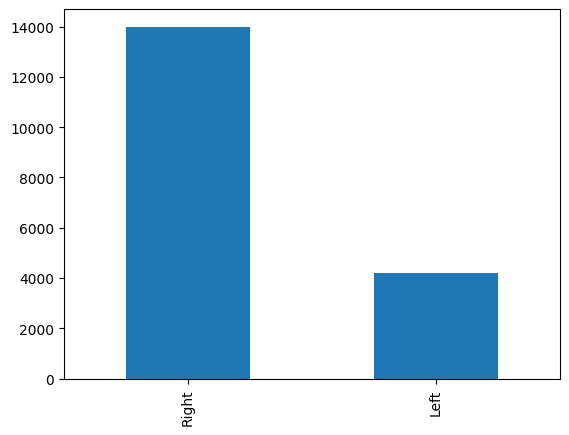

In [74]:
df['Preferred Foot'].value_counts().plot(kind='bar')

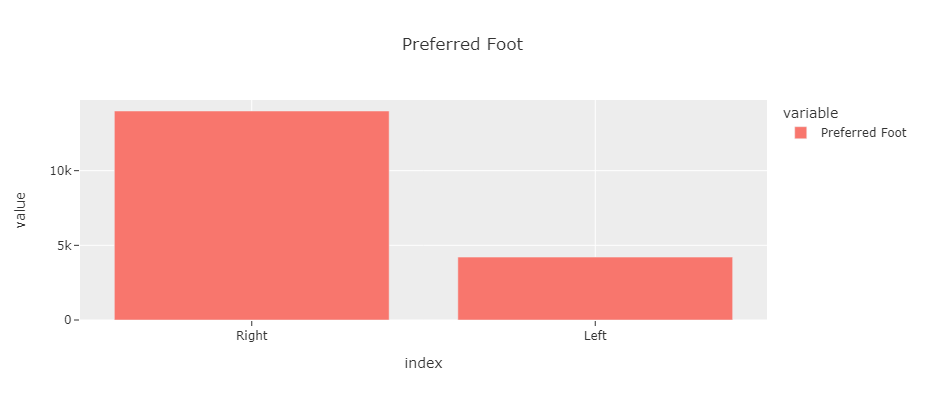

In [75]:
px.bar(df['Preferred Foot'].value_counts() , template='ggplot2', title='Preferred Foot', width=500, height=400)

In [76]:
import plotly.io as pio
# Templates : ["plotly", "plotly_white", "plotly_dark", "ggplot2", "seaborn", "simple_white", "none"]
pio.templates.default = "seaborn"

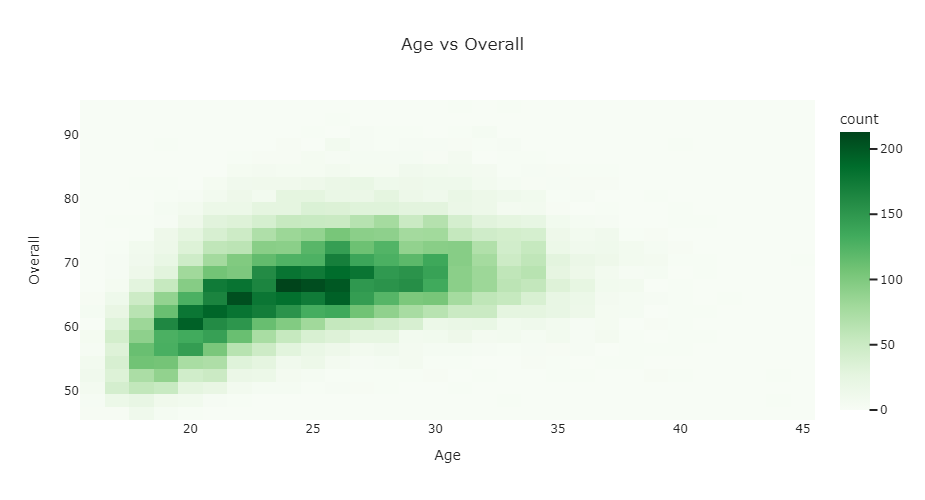

In [77]:
px.density_heatmap(df, x='Age', y='Overall', title='Age vs Overall', width=600, height=500,color_continuous_scale='Greens')

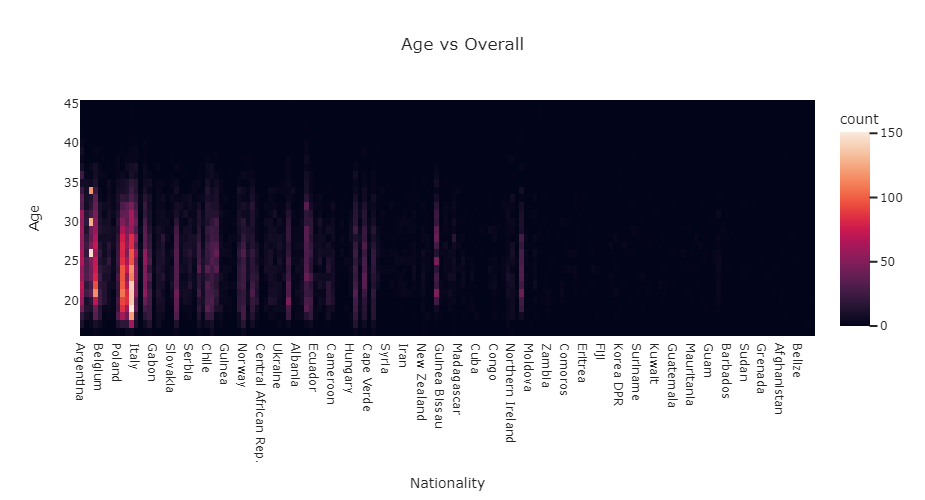

In [78]:
px.density_heatmap(df, y='Age', x='Nationality', title='Age vs Overall', width=600, height=500)

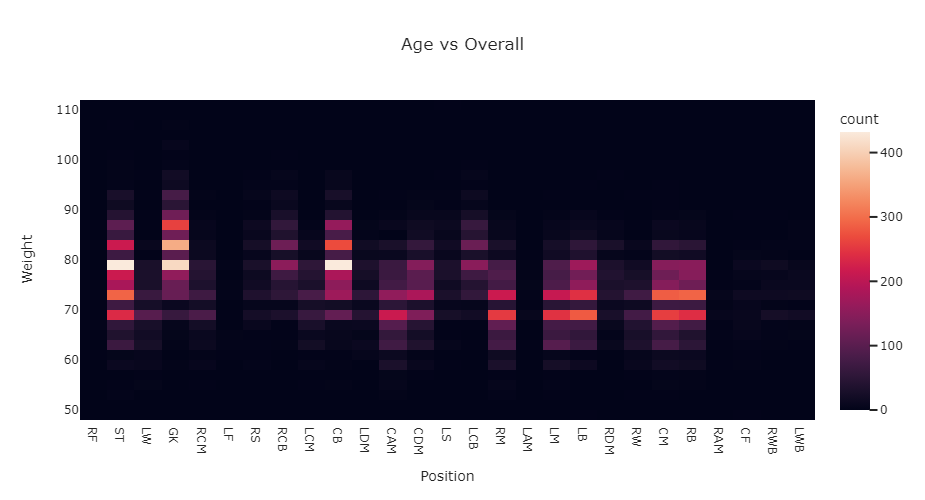

In [79]:
px.density_heatmap(df, y='Weight', x='Position', title='Age vs Overall', width=800, height=500)

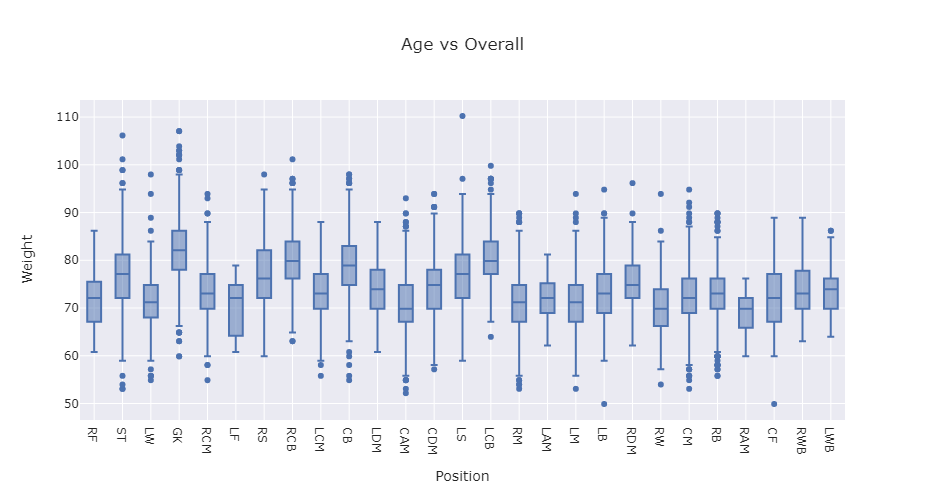

In [80]:
px.box(df, y='Weight', x='Position', title='Age vs Overall', width=800, height=500)

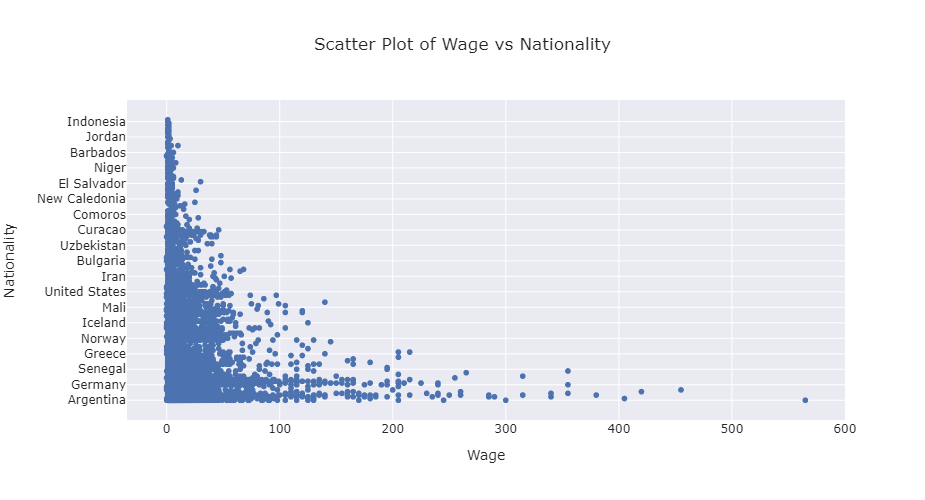

In [81]:
quant_viz(df, 'Wage', 'Nationality')

In [82]:
index = df.groupby('Position').idxmax()['Overall']
df[['Name', 'Overall', 'Position']].loc[index].sort_values(by='Overall', ascending=False)

/tmp/ipykernel_11814/3463994987.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.idxmax is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,Name,Overall,Position
1,Cristiano Ronaldo,94,ST
0,L. Messi,94,RF
2,Neymar Jr,92,LW
5,E. Hazard,91,LF
7,L. Suárez,91,RS
4,K. De Bruyne,91,RCM
3,De Gea,91,GK
8,Sergio Ramos,91,RCB
12,D. Godín,90,CB
11,T. Kroos,90,LCM


In [83]:
df.groupby('Position').max()['Overall'].reset_index()

/tmp/ipykernel_11814/737949909.py:1: FutureWarning:

Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.



,Position,Overall
0,CAM,89
1,CB,90
2,CDM,89
3,CF,82
4,CM,86
5,GK,91
6,LAM,88
7,LB,88
8,LCB,89
9,LCM,90


In [84]:
df[df['Overall']== df['Overall'].max()]

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Foot,International Reputation,Skill Moves,Position,Joined,Height,Weight,Age_Group
0,L. Messi,31,Argentina,94,94,FC Barcelona,110500.0,565.0,Left,5.0,4.0,RF,2004,170.18,72.121128,Senior
1,Cristiano Ronaldo,33,Portugal,94,94,Juventus,77000.0,405.0,Right,5.0,5.0,ST,2018,187.96,83.007336,Senior


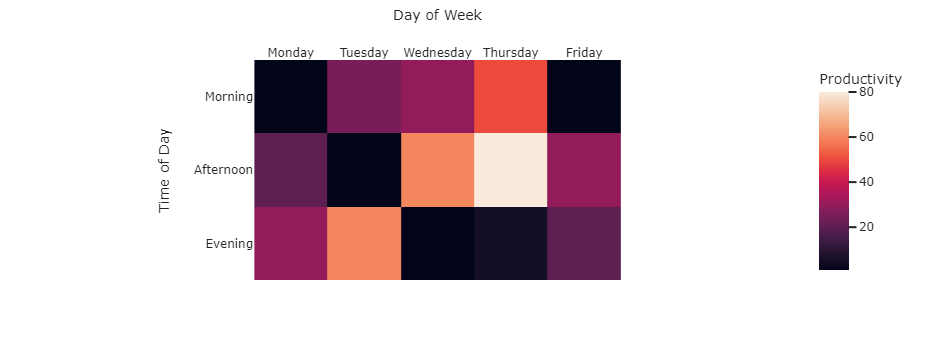

In [85]:
data=[[1, 25, 30, 50, 1], [20, 1, 60, 80, 30], [30, 60, 1, 5, 20]]
fig = px.imshow(data,
                labels=dict(x="Day of Week", y="Time of Day", color="Productivity"),
                x=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'],
                y=['Morning', 'Afternoon', 'Evening']
               )
fig.update_xaxes(side="top")
fig.show()

In [86]:
data=[[1, 25, 30, 50, 1], [20, 1, 60, 80, 30], [30, 60, 1, 5, 20]]
d= pd.DataFrame(data, columns=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'], index=['Morning', 'Afternoon', 'Evening'])
d

,Monday,Tuesday,Wednesday,Thursday,Friday
Morning,1,25,30,50,1
Afternoon,20,1,60,80,30
Evening,30,60,1,5,20


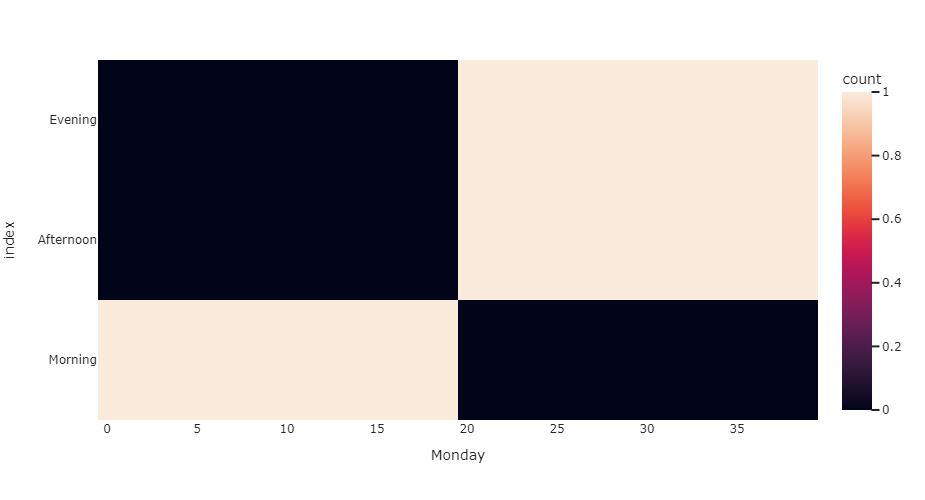

In [87]:
px.density_heatmap(d, x='Monday', width=600, height=500)

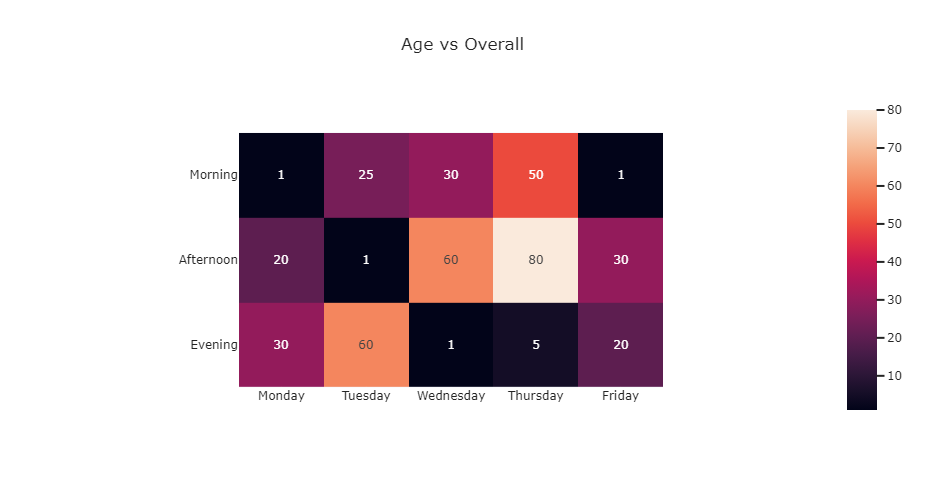

In [88]:
px.imshow(d, title='Age vs Overall', width=600, height=500, text_auto= True)

In [89]:
%%writefile my_module.py

import streamlit as st
import pandas as pd
import plotly.express as px

def quant_analysis(df, col, group=None, n=5):
    st.write(f'Average {col} of Players (Mean , Median): ', round(df[col].mean(), 1),',', round(df[col].median(),1))
    st.write(f'Maximum {col} of Players: ', df[col].max(),'----> Player : ', df[df[col] == df[col].max()]['Name'].values[0])
    st.write(f'Minimum {col} of Players: ', df[col].min(),'----> Player : ', df[df[col] == df[col].min()]['Name'].values[0])    
    st.write('-'*50)
    if group:
        st.write(f'Largest Average {col} per {group} : ', df.groupby([group])[col].median().nlargest(n))
        st.write(f'Smallest Average {col} per {group} : ', df.groupby([group])[col].median().nsmallest(n))

def quant_viz(df, x, y= None, group=None, query=None):
    if y:
        st.plotly_chart(px.scatter(df, x=x, y=y, title=f'Scatter Plot of {x} vs {y}', width=500, height=500)) 
    else: 
        col1, col2 = st.columns(2)  
        col1.plotly_chart(px.histogram(df, x=x, nbins=20, title=f'Histogram of {x}', width=500, height=400)) 
        col2.plotly_chart(px.box(df, y=x, title=f'Box Plot of {x}', width=500, height=500)) 
        if group:
            st.plotly_chart(px.box(df[df[group] == query] ,y=x, title=f'Box Plot of {x} for {group} : {query}', width=1000, height=500)) 

Overwriting my_module.py


In [90]:
%%writefile fifa_app2.py

import streamlit as st
import pandas as pd
import plotly.express as px
import my_module as m

fifa = pd.read_csv('fifa_eda.csv')
quant_features = [col for col in fifa.columns if fifa[col].dtypes != 'O']
qualt_features = [col for col in fifa.columns if fifa[col].dtypes == 'O']
   

st.title('FIFA 2019')
st.markdown('''
This app performs simple EDA on FIFA 2019 data
''')
feature = st.selectbox('Select a feature', fifa.columns)
group = st.selectbox('Select a group',fifa.columns)
if feature in quant_features:
    m.quant_analysis(fifa, feature, group=group)
    m.quant_viz(fifa, feature)
else:
    st.write(fifa[feature].value_counts())
    
    

Overwriting fifa_app2.py


In [91]:
#!streamlit run fifa_app2.py